# Notebook Version: 19.10.2000 Gernot
## Changelog:

introduced 3 global variables:
* channels: which just stand for the channel names so we can slice them conveniently in pandas no matter how the dataframe looks
* labels: are the different viruses we can detect
* default_features = channels

I created the function make_labels, which checks how many different combinations of labels there are (double positives, triple positives, etc...) and then encodes it into integers.

pairwise_plots_labels then plots the data with those labels

I changed the logic of the plotting functions: they now require "features" as an argument: this specifies what columns of the pd dataframe DB Scan should be run on (because for TSNE, UMAP, etc... it can be different from just the channels).

I created a few functions which transform the datasets in certain ways (scaling, decorrelation, etc...)

I removed some unnecessary plots and added other, more interesting ones.

In [42]:
import numpy as np
import pandas as pd
import sklearn.cluster as cl
import matplotlib.pyplot as plt
import itertools
from typing import Dict
import data_lib

In [2]:
import umap
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

In [3]:
# print available data summary
_ = data_lib.explore_datasets(datafolder="../Data",verbose=True)

----------------------------------------------------------------------------------------------
-- The following 4 groups were found
-- They contain 40 datasets
-- The first printed entity is the key to the returned dictionary
-----------------------------------
Group: ../Data/6P-positive-dilution-series-labelled/droplet-level-data/RawData
po-di-se-B8, files: 13                  po-di-se-C8, files: 13                  po-di-se-A8, files: 13
-----------------------------------
Group: ../Data/6P-positive-dilution-series-2-labelled/droplet-level-data/RawData
po-di-se-2-C4, files: 13                po-di-se-2-A1, files: 13                po-di-se-2-C1, files: 13
po-di-se-2-A4, files: 13                po-di-se-2-B1, files: 13                po-di-se-2-D4, files: 13
-----------------------------------
Group: ../Data/6P-positive-dilution-series-1-labelled/droplet-level-data/RawData
po-di-se-1-A4, files: 13                po-di-se-1-C1, files: 13                po-di-se-1-C4, files: 13
po-di-s

In [4]:
labels = ["IAV-M_POS",
             "IBV-M_POS",
             "MHV_POS",
             "RSV-N_POS",
             "SARS-N1_POS",
             "SARS-N2_POS"]

In [43]:
def pairwise_plots_labels(df: pd.DataFrame) -> None:
    '''
    Takes pandas DataFrame as input that contains the 6 color channels as columns as well as a column called
    "numerical_label"; proceeds to draw all possible 2 dimensional scatter plots.
    '''
    combinations = itertools.combinations(df[channels], 2)
    fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
    fig.set_figheight(15)
    fig.set_figwidth(15)
    for i, combination in enumerate(combinations): 
        X = df.loc[:, combination]
        X = X.to_numpy()

        ax[i //3, i %3].set_xlabel(combination[0])
        ax[i //3, i %3].set_ylabel(combination[1])
        ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = df["numerical_label"])
    fig.tight_layout()

In [6]:
def make_labels(df: pd.DataFrame):
    '''
    Operates inplace on the given DataFrame.
    Looks for all different label combinations, adds those to a label column.
    Then creates a numerical_label column which encodes those string labels into integers.
    '''
    labels = []
    for j in range(len(df)):
        row = df.loc[j][6:]
        keys = row.keys()
        label = ""
        for i in range(len(row)):
            if row[i] == 1:
                label += f" {keys[i]}"
        if not label:
            label = "None"
        labels.append(label.strip())

    df["label"] = labels
    
    color_dict = {}
    i = 0
    for label in set(labels):
        color_dict[label] = i
        i += 1
    df["numerical_label"] = df["label"].apply(lambda x: color_dict.get(x))

    return df

In [7]:
def rescale_dataset(df, features):
    scaler = MinMaxScaler()
    df[features] = scaler.fit_transform(df[features])
    return df

In [22]:
def decorrelate_dataset(df, features):
    pca = PCA(whiten=True)
    df[features] = pca.fit_transform(df[features])
    return df

In [9]:
def umap_transform_dataset(df, features):
    reducer = umap.UMAP()
    df[["umap1", "umap2"]] = reducer.fit_transform(df[features])

In [10]:
def tsne_transform_dataset(df, features, n_components = 2, perplexity = 15):
    tsne = TSNE(n_components=n_components, learning_rate='auto', init='random', perplexity=perplexity)
    df[[f"tsne{i+1}" for i in range(n_components)]] = tsne.fit_transform(df[features])

# DB Scan

In [11]:
channels = ['Chan1_FluoValue', 'Chan2_FluoValue', 'Chan3_FluoValue',
       'Chan4_FluoValue', 'Chan5_FluoValue', 'Chan6_FluoValue']
default_features = channels

In [12]:
def do_db_scan_preds(X: np.array, eps: float, min_samples: int):
    classifier = cl.DBSCAN(eps = eps, min_samples = min_samples)
    preds = classifier.fit_predict(X)
    return preds

In [13]:
def pairwise_plots_dbscan(df, features, eps: float, min_samples: int = 5):
    
    np_features = df[features].to_numpy() # grab features to cluster on
    preds = do_db_scan_preds(np_features, eps, min_samples) # get clusters
    
    print(f"Number of outliers: {len([x for x in preds if x == -1])}") # print number of outliers
    print(f"Number of clusters: {max(preds)+1}") # print number of clusters
    
    
    combinations = itertools.combinations(df[channels].columns, 2)
    fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
    fig.set_figheight(15)
    fig.set_figwidth(15)
    for i, combination in enumerate(combinations): 
        np_features = df.loc[:, combination]
        np_features = np_features.to_numpy()

        ax[i //3, i %3].set_xlabel(combination[0])
        ax[i //3, i %3].set_ylabel(combination[1])
        ax[i //3, i %3].scatter(np_features[:, 0], np_features[:, 1], c = preds)
    fig.tight_layout()

## A3 Dataset

Number of outliers: 23
Number of clusters: 5


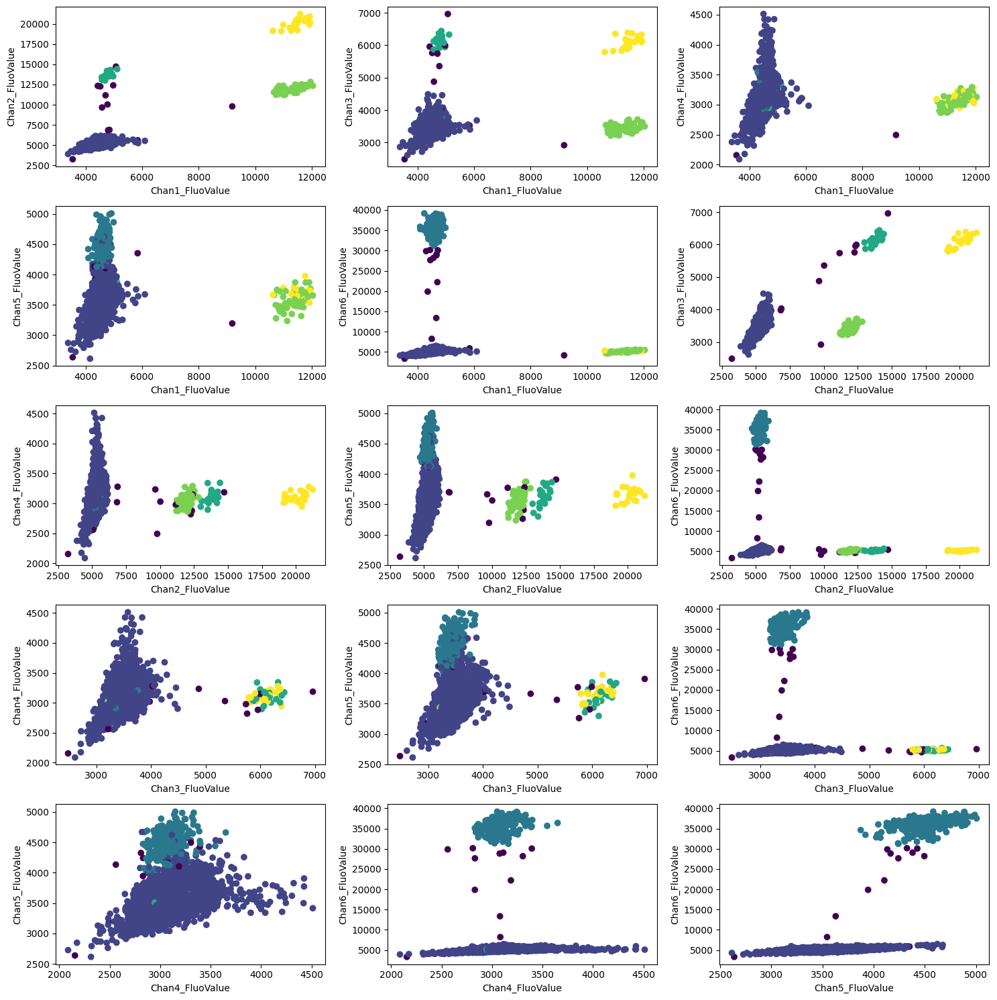

In [14]:
df = data_lib.load_dataset(labels, ["wa-sa-A3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

## B3 Dataset

Number of outliers: 33
Number of clusters: 5


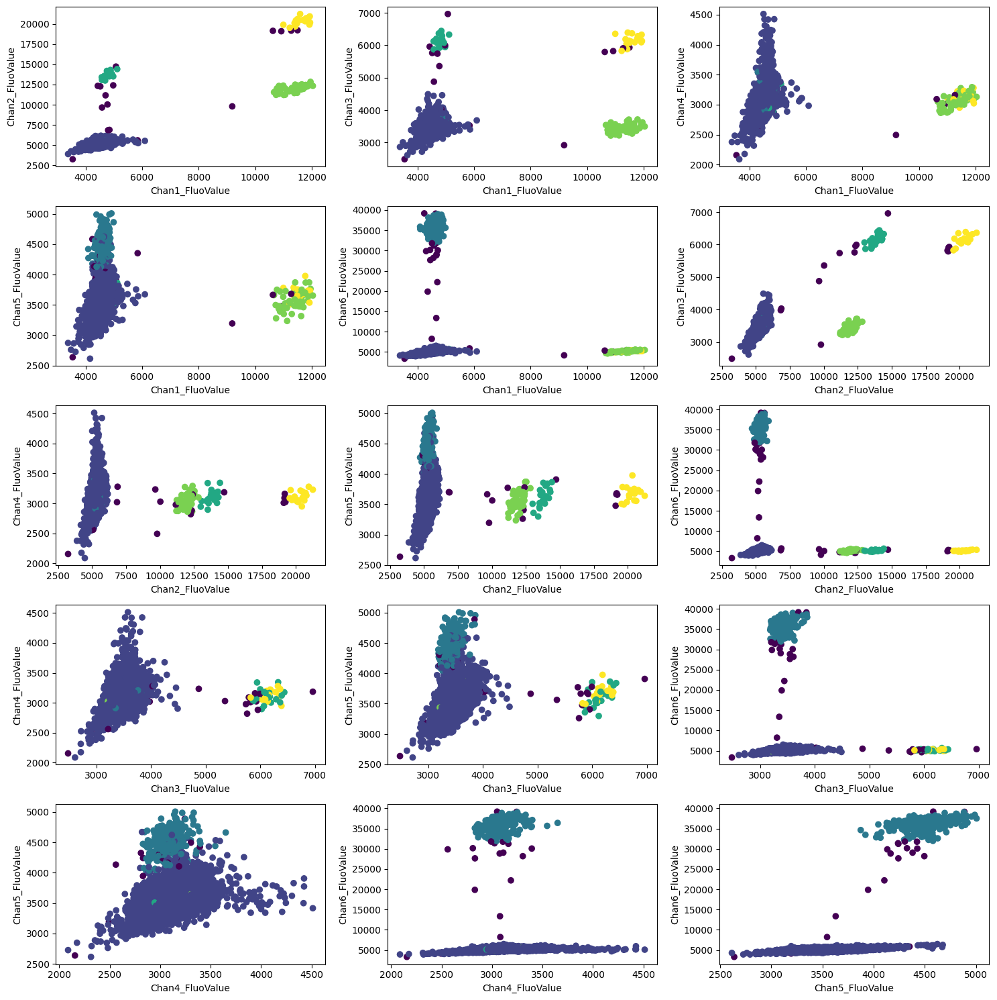

In [15]:
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 10)

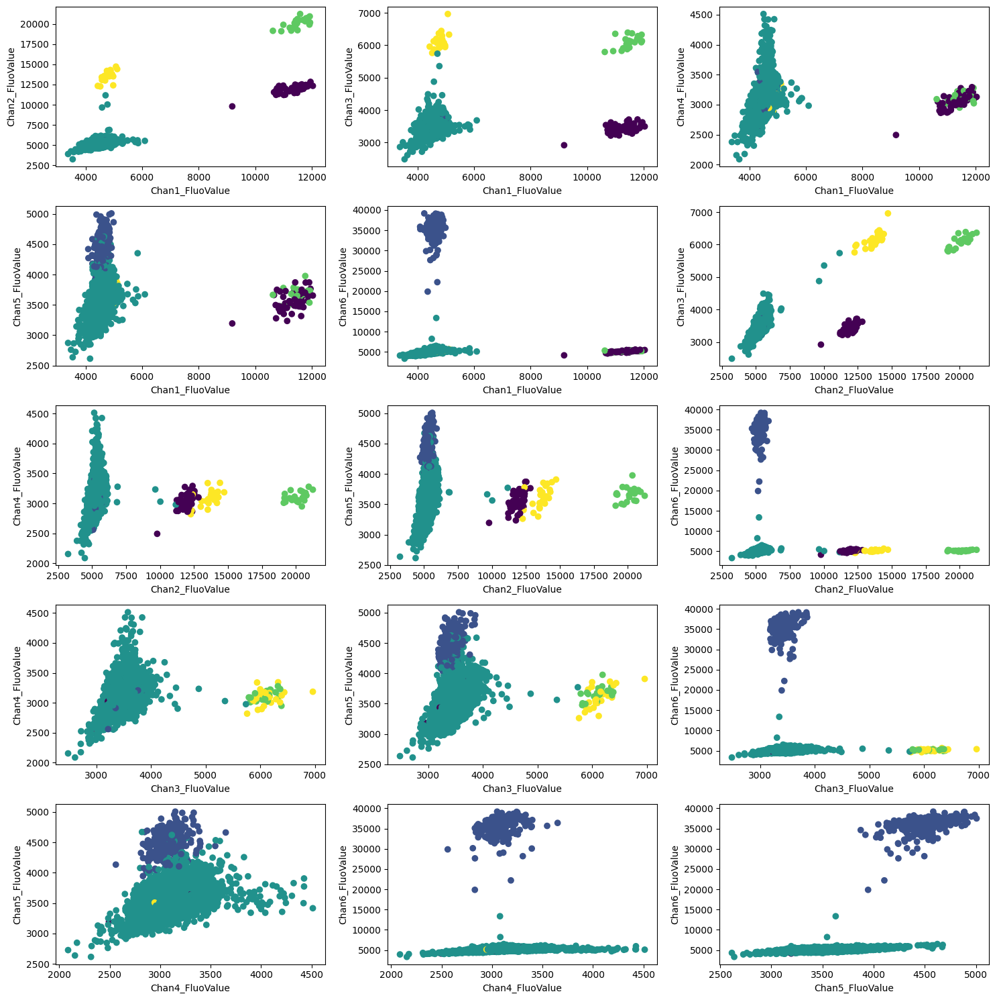

In [16]:
make_labels(df)
pairwise_plots_labels(df)

## C3 Dataset (POSITIVE CONTROL)

Number of outliers: 229
Number of clusters: 25


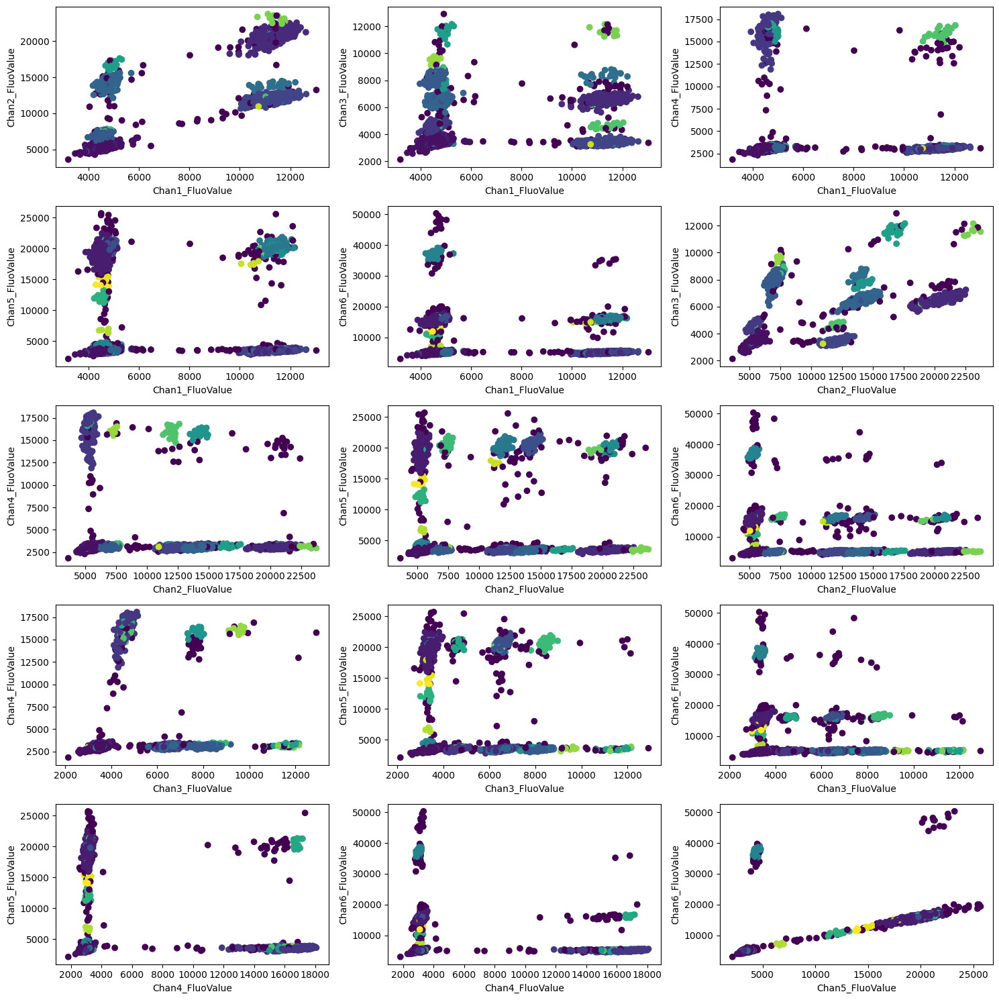

In [17]:
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

Number of clusters in the original data: 39


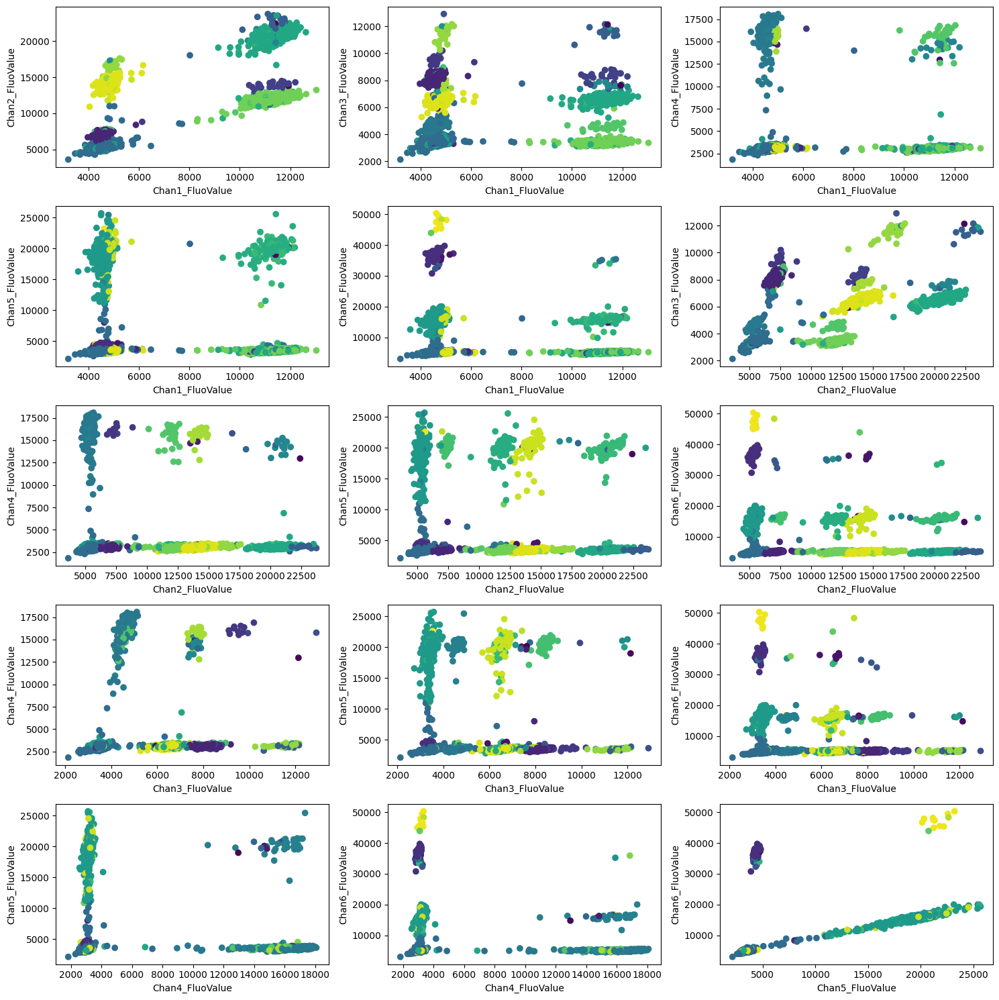

In [18]:
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))+1}")
pairwise_plots_labels(df)

In [19]:
counts = df["label"].value_counts()
counts = counts.drop(counts[counts <= 5].index)
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 21


### C3 Dataset with preprocessing data

Number of outliers: 57
Number of clusters: 21


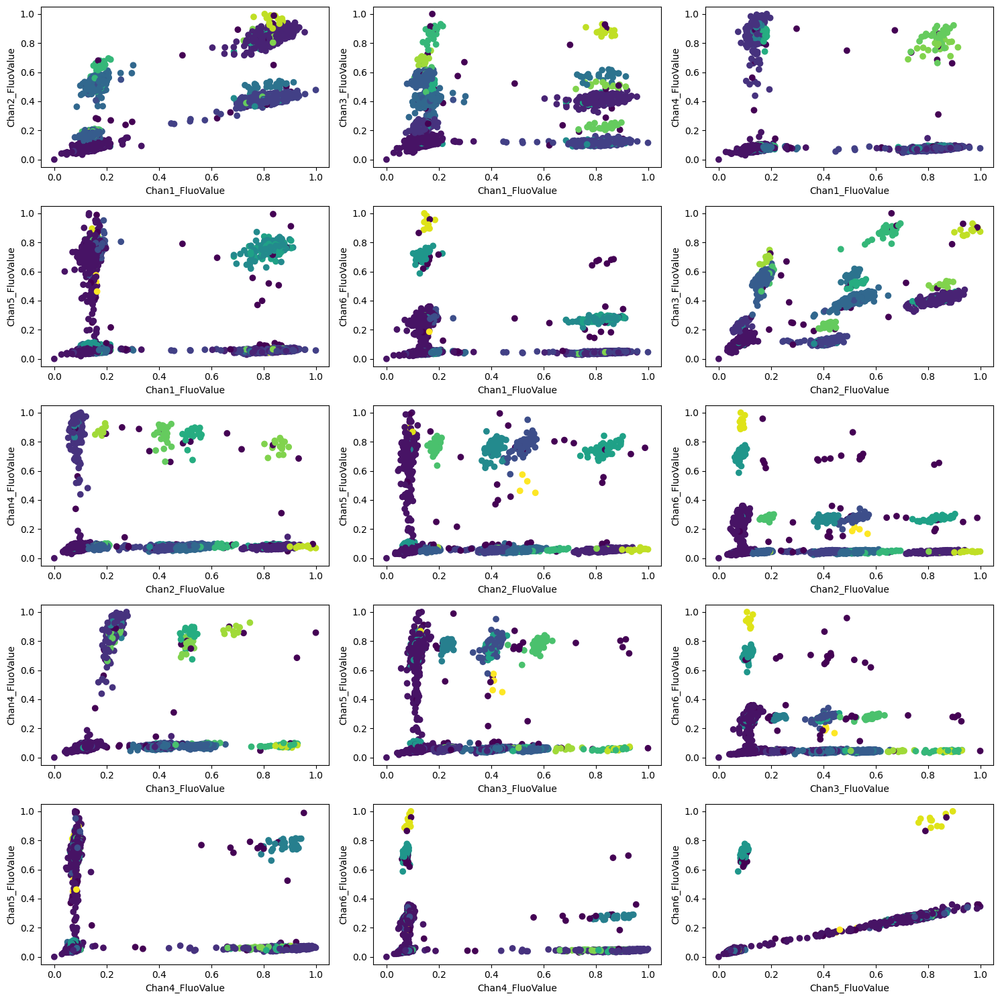

In [20]:
# scaling to [0, 1]
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
df = rescale_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = default_features, eps = 0.1, min_samples = 5)

Number of outliers: 45
Number of clusters: 21


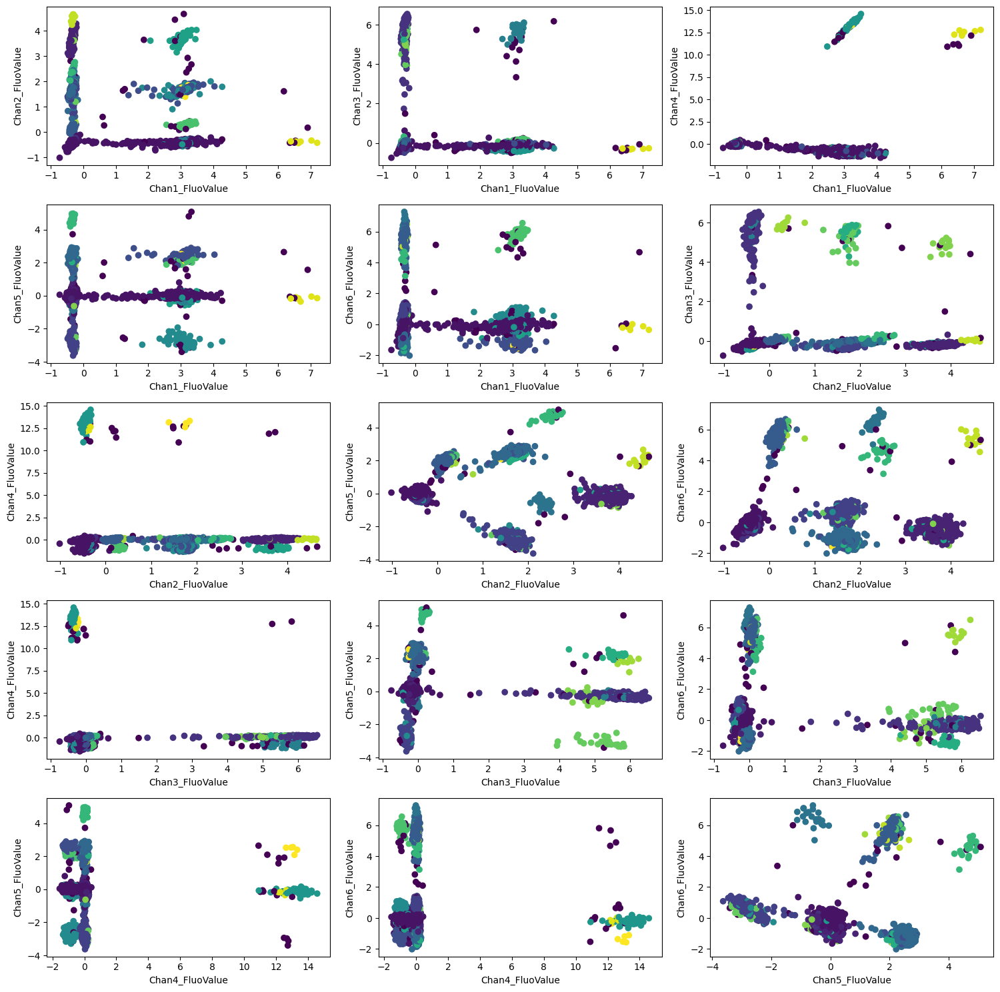

In [23]:
# PCA decorrelation
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
decorrelate_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = default_features, eps = 0.85, min_samples = 5)

/home/gernot/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of outliers: 0
Number of clusters: 21


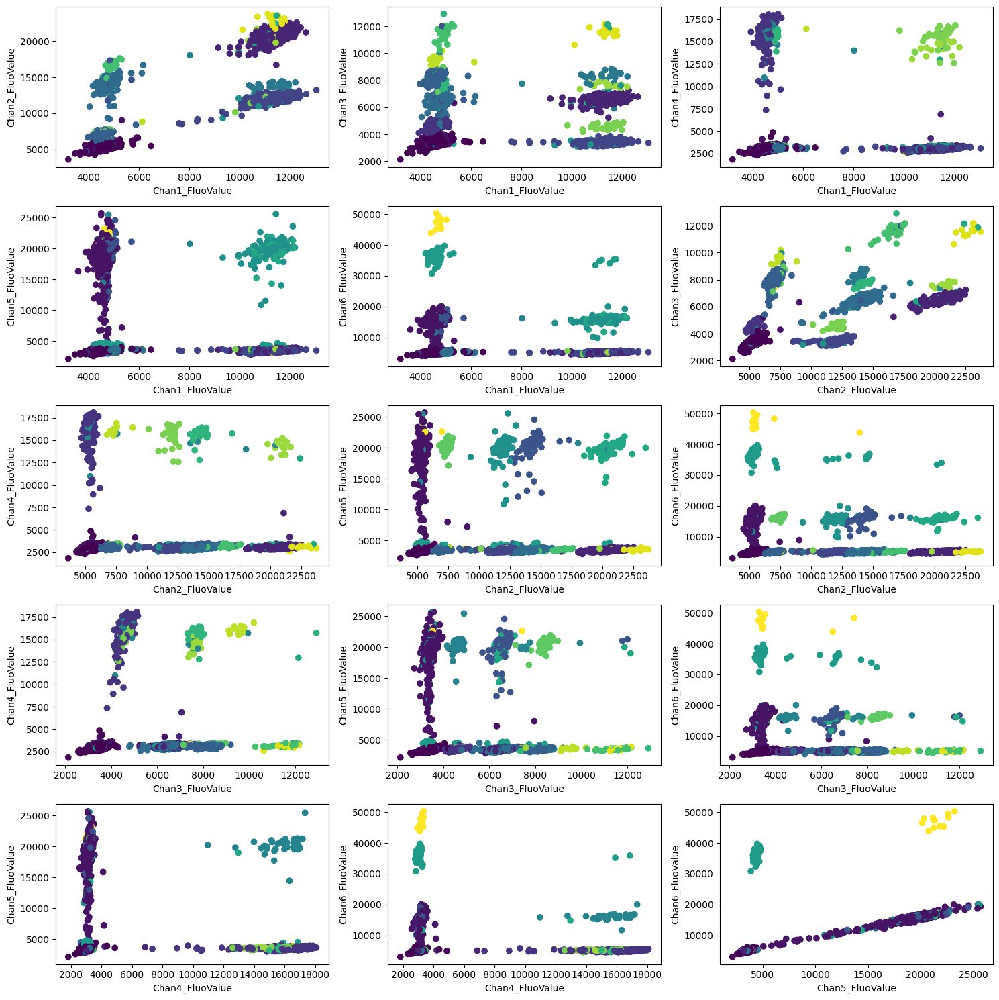

In [24]:
# UMAP 
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
umap_transform_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.85, min_samples = 5)

Number of outliers: 0
Number of clusters: 20


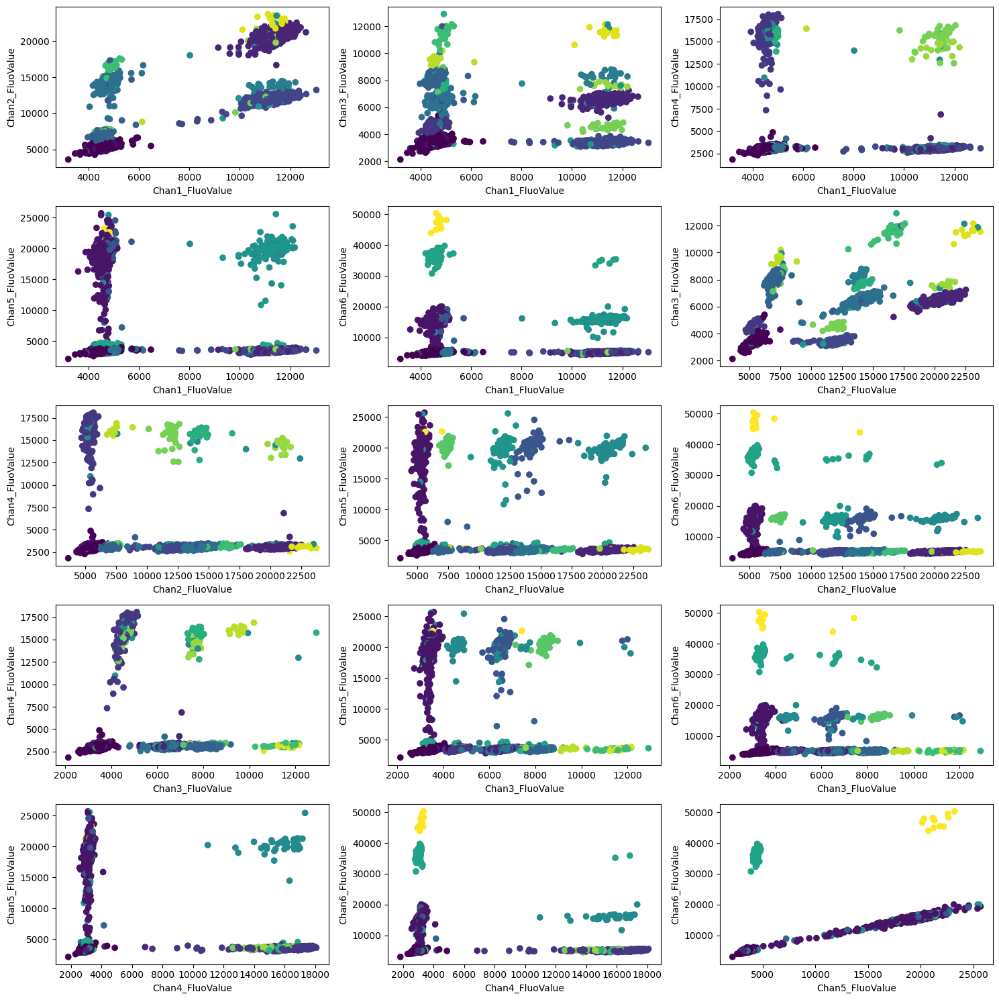

In [33]:
# TSNE 2 components (2d)
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
tsne_transform_dataset(df, features = default_features, n_components = 2)
pairwise_plots_dbscan(df, features = ["tsne1", "tsne2"], eps = 6, min_samples = 5)

### DB Scan on D3 Dataset (NEGATIVE CONTROL)

Number of outliers: 12
Number of clusters: 1


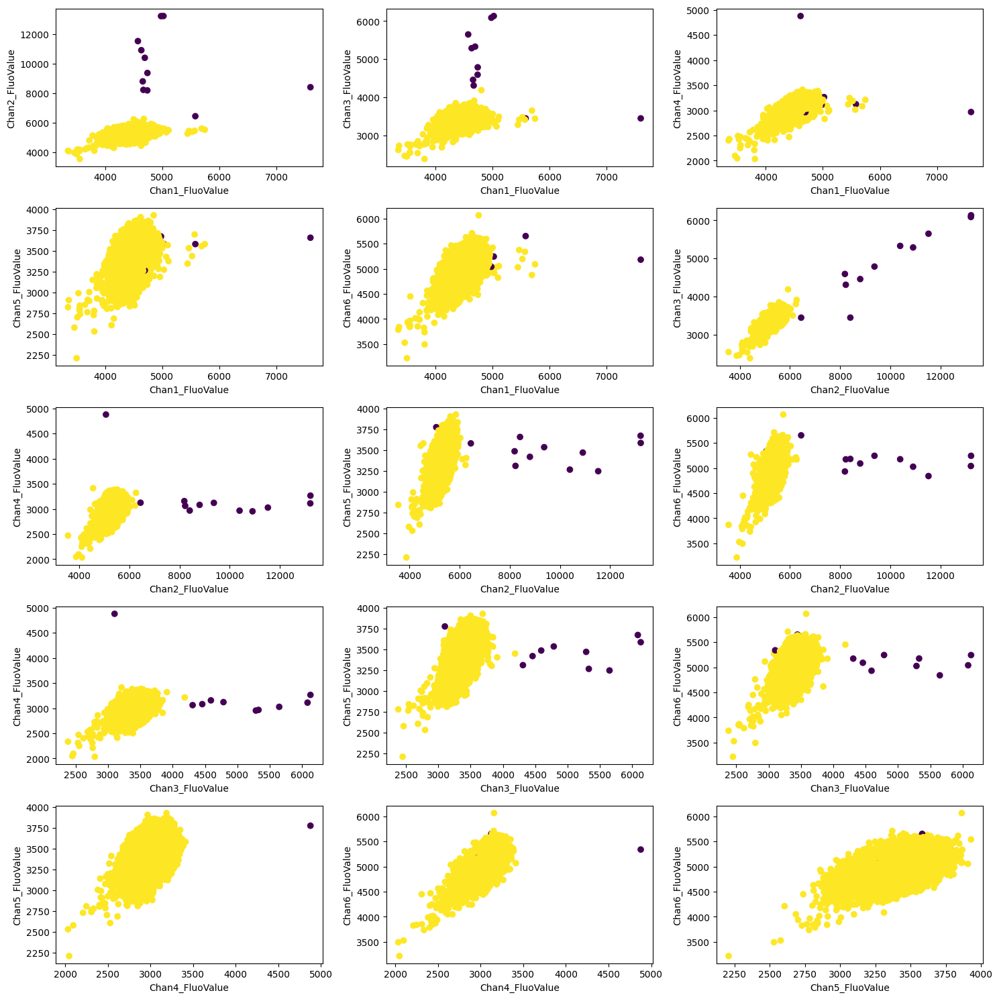

In [34]:
# vanilla way
df = data_lib.load_dataset(labels, ["wa-sa-D3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

Number of clusters in the original data: 2


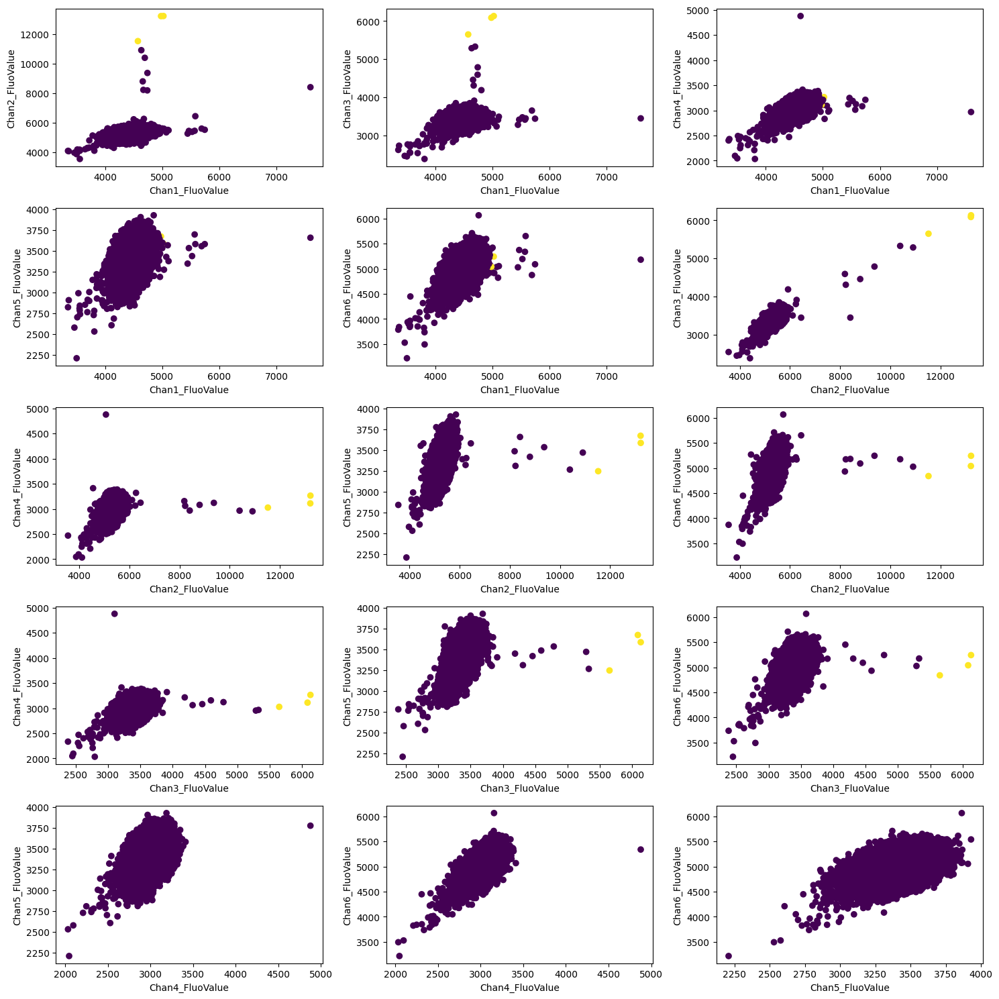

In [21]:
df = data_lib.load_dataset(labels, ["wa-sa-D3"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

In [22]:
counts = df["label"].value_counts()
counts = counts.drop(counts[counts <= 5].index)
counts
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 1


### DB Scan on C2 Dataset

Number of outliers: 16
Number of clusters: 4


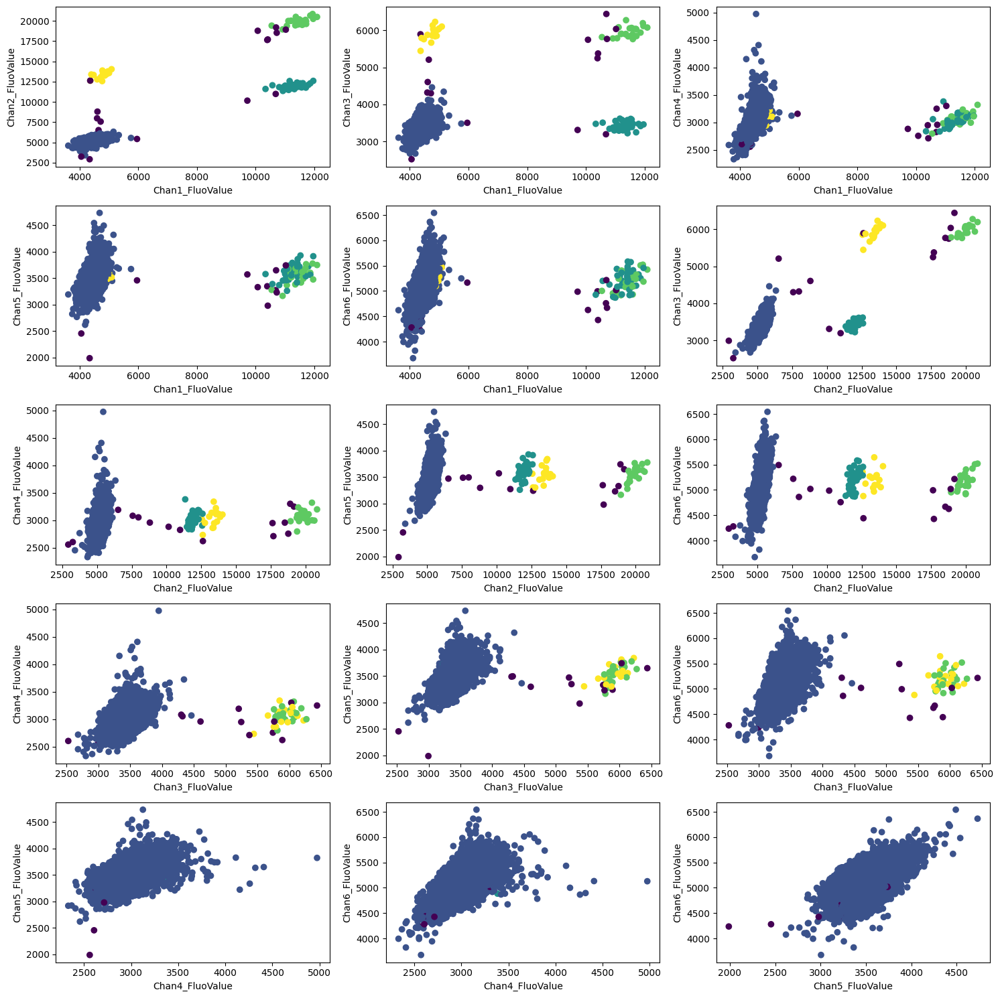

In [25]:
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
pairwise_plots_dbscan(df, eps = 700, min_samples = 5)

Number of clusters in the original data: 4


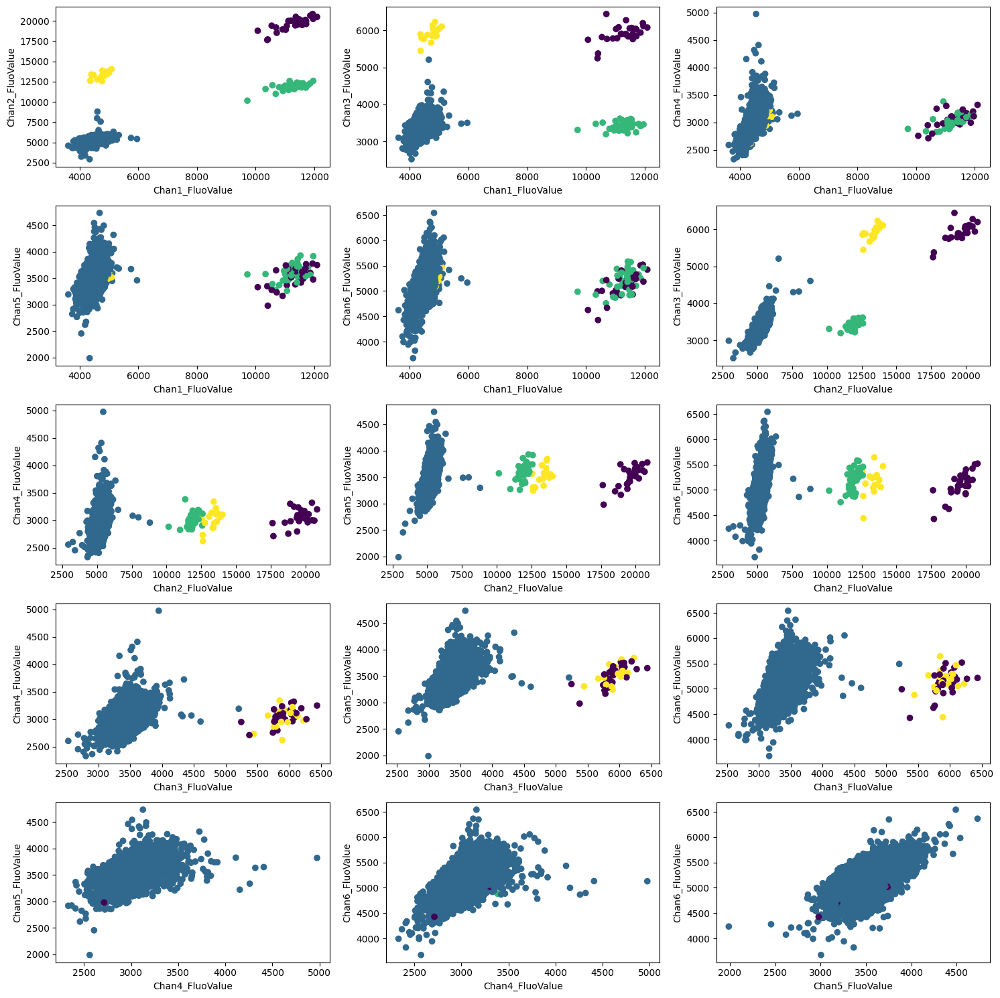

In [27]:
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

Number of outliers: 0
Number of clusters: 4


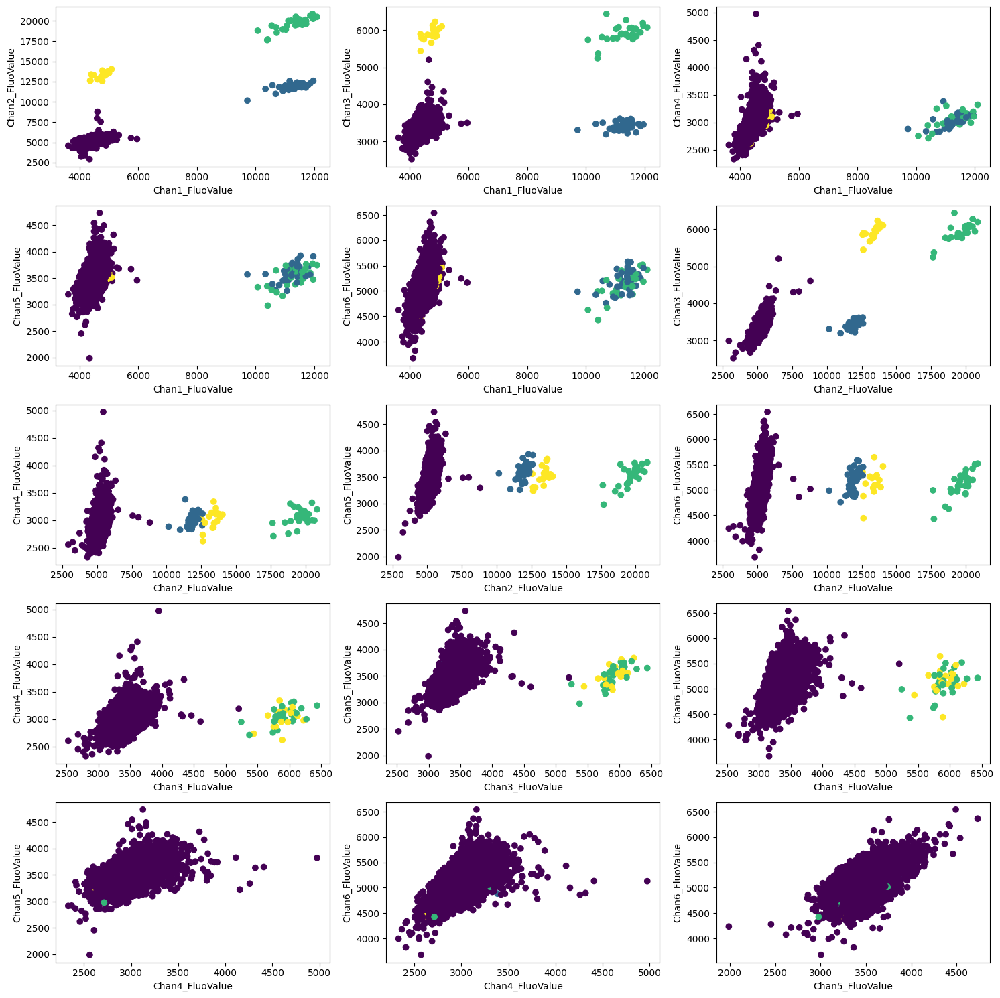

In [37]:
# UMAP 
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
umap_transform_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.85, min_samples = 5)

# Dillution Series Data

Number of outliers: 7937
Number of clusters: 77


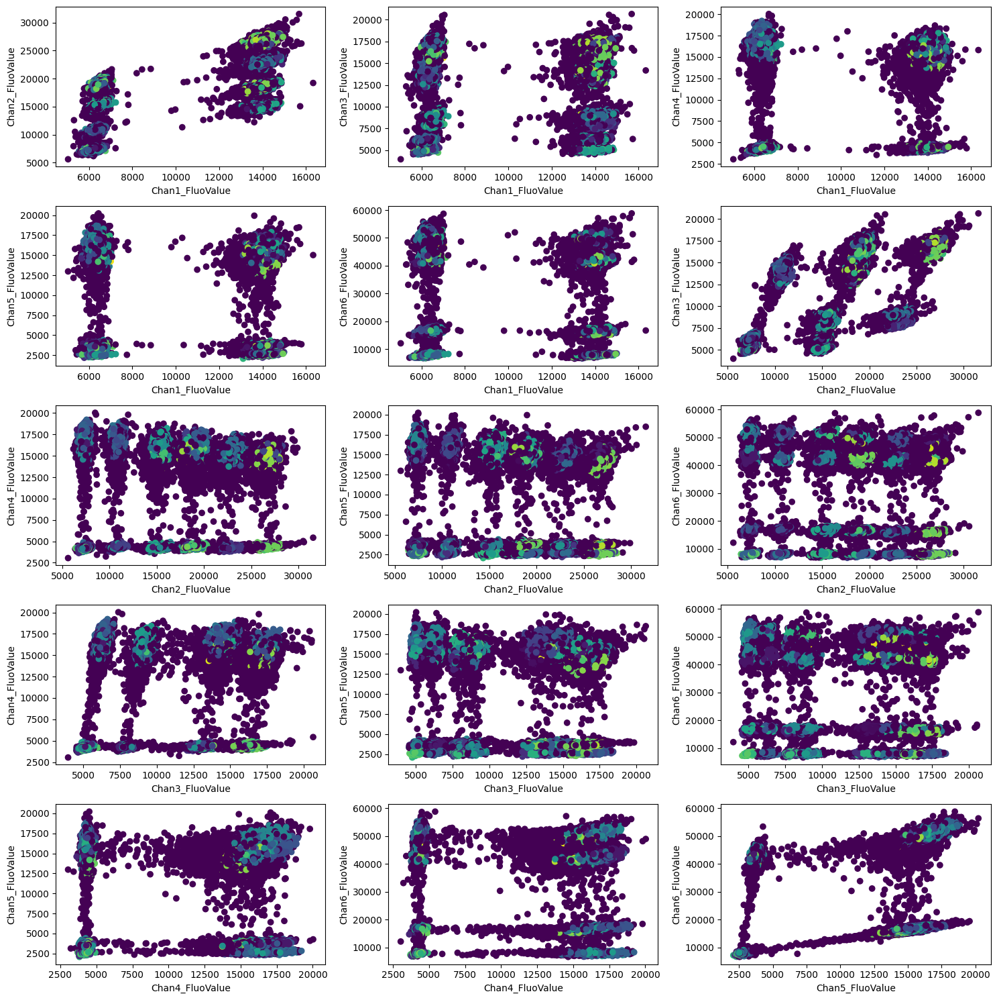

In [38]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 10)

Number of clusters in the original data: 64


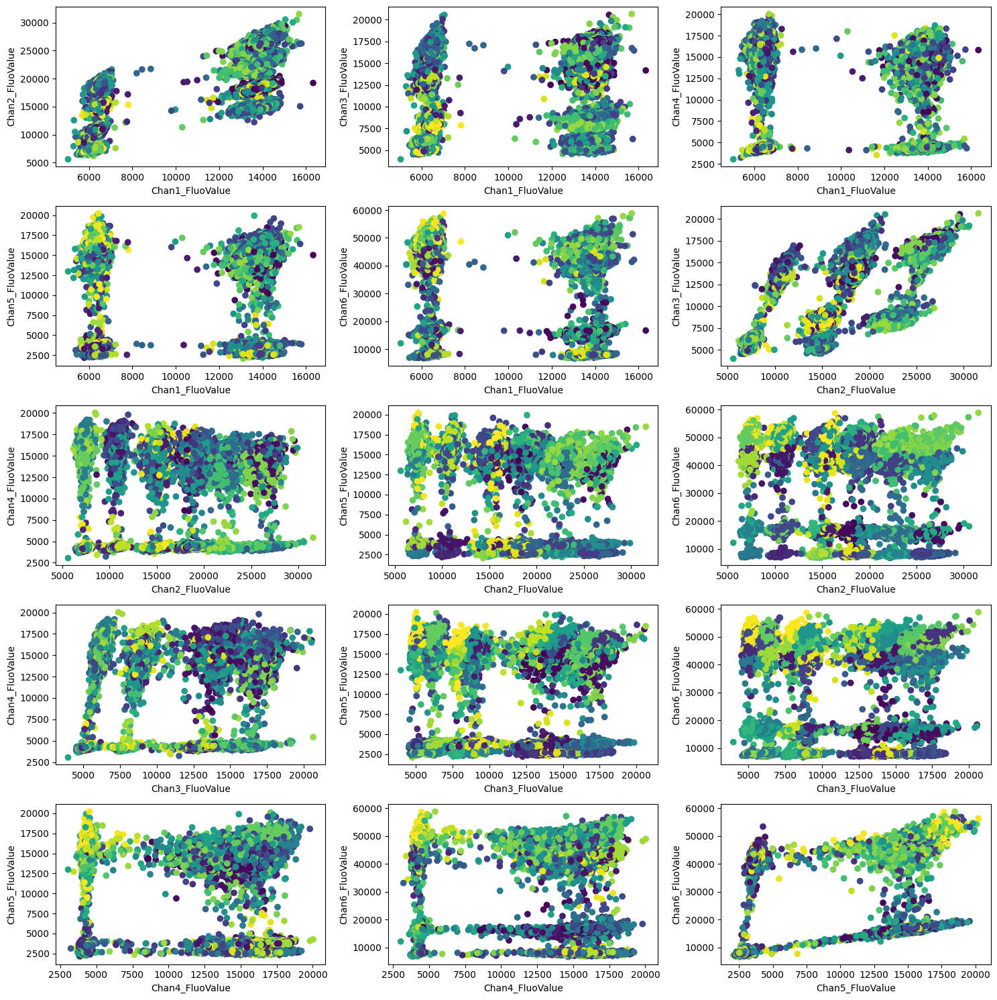

In [39]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

In [94]:
counts = df["label"].value_counts()
counts

IAV-M_POS MHV_POS RSV-N_POS                                      1057
IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS                            1023
IAV-M_POS MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS               837
IAV-M_POS RSV-N_POS                                               804
IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS     772
                                                                 ... 
SARS-N1_POS                                                       155
SARS-N1_POS SARS-N2_POS                                           148
SARS-N2_POS                                                       129
IBV-M_POS SARS-N1_POS                                             125
IBV-M_POS SARS-N2_POS                                             100
Name: label, Length: 64, dtype: int64

In [95]:
counts = counts.drop(counts[counts <= 5].index)
counts
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 64


Number of outliers: 0
Number of clusters: 64


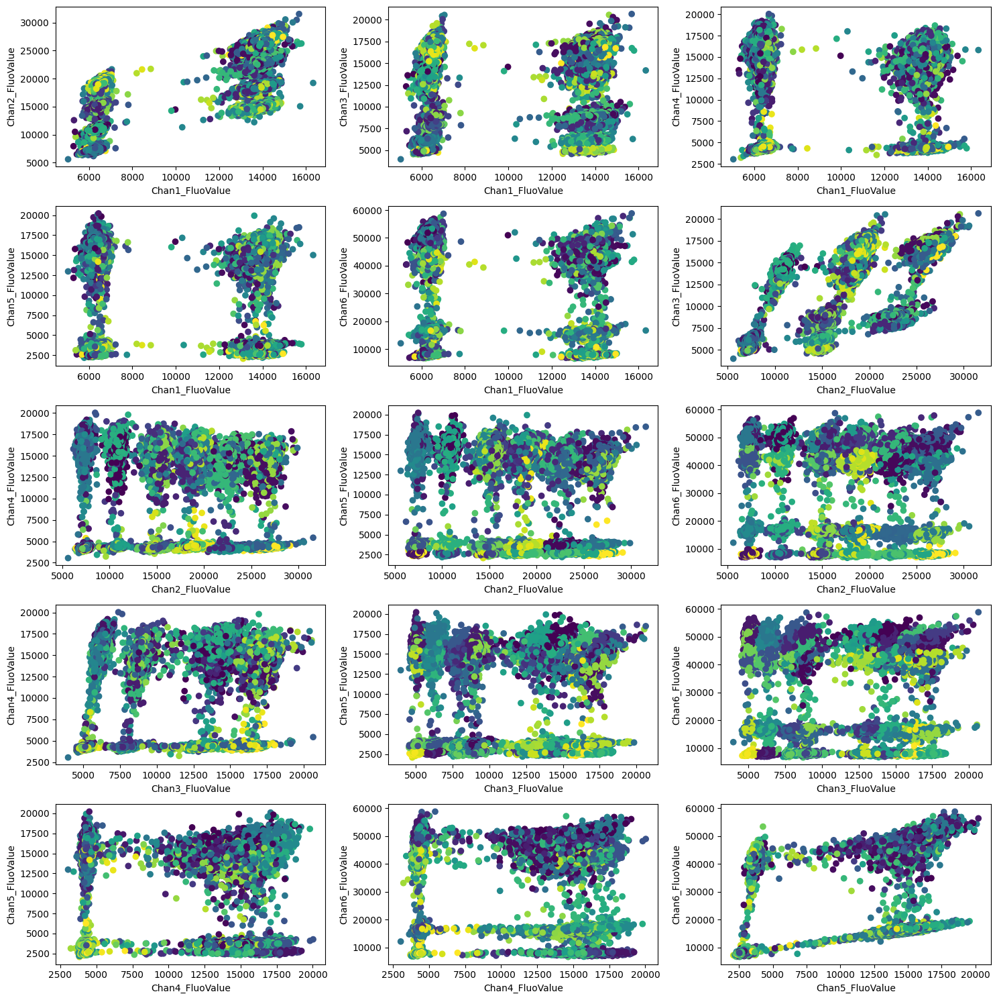

In [41]:
# UMAP 
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
umap_transform_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.8, min_samples = 5)

# TESTING THE ACCURACY OF THE CLUSTERS

What I am doing here is assigning every predicted cluster to the real cluster it shares most data points with. I then say that the error is the total number of data points that are in the predicted cluster but not in the real cluster that the predicted cluster is most similar to.

In [129]:
# creating the true labels
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
make_labels(df)

In [130]:
# building dictionary
real_clusters = {}
for i in set(df.numerical_label):
    real_clusters[i] = df.numerical_label[df.numerical_label == i].index.tolist()

In [131]:
# making the predictions for clusters
umap_transform_dataset(df, features = default_features)
X = df[["umap1", "umap2"]].to_numpy()
preds = do_db_scan_preds(X, eps = 0.8, min_samples = 5)

In [132]:
df["preds"] = preds

In [133]:
# building dictionary
predicted_clusters = {}
for i in set(df.preds):
    predicted_clusters[i] = df.preds[df.preds == i].index.tolist()

In [134]:
def most_similar_cluster(cluster1, clusters):
    """
    cluster1: list
    clusters: dictionary where the items are lists
    --
    
    returns:
        best_cluster: the real cluster that shares the highest amount of datapoints with cluster1
        best_sim: the number of data points shared between cluster1 and best_cluster
    """
    best_sim = 0
    best_cluster = 0
    
    for (key, cluster) in clusters.items():
        similarity = len(set(cluster1).intersection(cluster))
        if similarity > best_sim:
            best_sim = similarity
            best_cluster = key

    return best_cluster, best_sim

In [135]:
num_wrongly_classified = 0
# go through all predicted clusters
for (key, cluster) in predicted_clusters.items():
    best_cluster, best_sim = most_similar_cluster(cluster, real_clusters)
    num_wrongly_classified += len(cluster) - best_sim

In [136]:
num_wrongly_classified

545

# Remarks and Ideas to Try Out

* I still dont really understand what the PCA decorrelation does. Not on a theoretical level, and also not to our specific data. Is it useful to check this out further?

* One can think of quite a few other criterions that measure how good a clustering is. Maybe think of some and implement some and see if they all perform quite well